# Image Captioning
Generating Captions for images

## Steps
## Data Collection
## Data Cleaning
## Loading the training set
## Data Preprocessing--images
## Data Preprocessing--Captions
## Data Preperation using Generator Function
## Word Embeddings
## Model Architecture
## Inference
## Evaluation

In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

The syntax of the command is incorrect.
'cp' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
!kaggle datasets download -d eeshawn/flickr30k

'kaggle' is not recognized as an internal or external command,
operable program or batch file.


In [ ]:
import zipfile
zip_ref=zipfile.ZipFile('/content/flickr30k.zip','r')
zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
def readTextFile(path):
    with open(path) as f:
        captions=f.read()
    return captions

In [ ]:
captions= readTextFile("/content/captions.txt")
captions=captions.split("\n")[:-1]
print(len(captions))
captions_list=captions

158916


So we have 158916 captions in our dataset

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
import re
import nltk
from nltk.corpus import stopwords
import string
import json
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Input, Dense, Dropout, Embedding, LSTM

from tensorflow.keras.layers import add

In [ ]:
captions

['image_name,comment_number,comment',
 '1000092795.jpg,0,Two young guys with shaggy hair look at their hands while hanging out in the yard .',
 '1000092795.jpg,1,Two young  White males are outside near many bushes .',
 '1000092795.jpg,2,Two men in green shirts are standing in a yard .',
 '1000092795.jpg,3,A man in a blue shirt standing in a garden .',
 '1000092795.jpg,4,Two friends enjoy time spent together .',
 '10002456.jpg,0,Several men in hard hats are operating a giant pulley system .',
 '10002456.jpg,1,Workers look down from up above on a piece of equipment .',
 '10002456.jpg,2,Two men working on a machine wearing hard hats .',
 '10002456.jpg,3,Four men on top of a tall structure .',
 '10002456.jpg,4,Three men on a large rig .',
 '1000268201.jpg,0,A child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201.jpg,1,A little girl in a pink dress going into a wooden cabin .',
 '1000268201.jpg,2,A little girl climbing the stairs to her playhouse .',
 '100026

Each Image is provided with 5 captions

In [ ]:
captions[0]

'image_name,comment_number,comment'

In [ ]:
captions[1]

'1000092795.jpg,0,Two young guys with shaggy hair look at their hands while hanging out in the yard .'

In [ ]:
descriptions={}
for i in captions[1:]:
    img_name,number,caption=i.split(',')
    img_name=img_name.split(".")[0]
    # if the image id is already present or not
    if img_name in descriptions:
        descriptions[img_name].append(caption)
    else:
        descriptions[img_name]=[caption]

In [ ]:
descriptions

{'1000092795': ['Two young guys with shaggy hair look at their hands while hanging out in the yard .',
  'Two young  White males are outside near many bushes .',
  'Two men in green shirts are standing in a yard .',
  'A man in a blue shirt standing in a garden .',
  'Two friends enjoy time spent together .'],
 '10002456': ['Several men in hard hats are operating a giant pulley system .',
  'Workers look down from up above on a piece of equipment .',
  'Two men working on a machine wearing hard hats .',
  'Four men on top of a tall structure .',
  'Three men on a large rig .'],
 '1000268201': ['A child in a pink dress is climbing up a set of stairs in an entry way .',
  'A little girl in a pink dress going into a wooden cabin .',
  'A little girl climbing the stairs to her playhouse .',
  'A little girl climbing into a wooden playhouse ',
  'A girl going into a wooden building .'],
 '1000344755': ['Someone in a blue shirt and hat is standing on stair and leaning against a window .',
  

## Data Cleaning

In [ ]:
#We shouldn't remove stopwords and don't do stemmming as it is required in the end while genrating the text.
import re
def clean_text(sentence):
    sentence=sentence.lower()
    sentence=re.sub("[^a-z]+"," ",sentence)#if not alphabet replace with space
    sentence=sentence.split()
    sentence=[s for s in sentence if len(s)>1]
    sentence=" ".join(sentence)
    return sentence

In [ ]:
 # clean all captions
for key,captions_list in descriptions.items():
    for i in range(len(captions_list)):
        captions_list[i]=clean_text(captions_list[i])

In [ ]:
# Write the data to text file
with open("descriptions_1.txt","w") as f:
    f.write(str(descriptions))

## Vocbulary

In [ ]:
#set of all unique words the model can predict
import json
descriptions=None
with open('descriptions_1.txt','r') as f:
    descriptions=f.read()
json_string=descriptions.replace("'","\"")
descriptions=json.loads(json_string)

In [ ]:
descriptions

{'1000092795': ['two young guys with shaggy hair look at their hands while hanging out in the yard',
  'two young white males are outside near many bushes',
  'two men in green shirts are standing in yard',
  'man in blue shirt standing in garden',
  'two friends enjoy time spent together'],
 '10002456': ['several men in hard hats are operating giant pulley system',
  'workers look down from up above on piece of equipment',
  'two men working on machine wearing hard hats',
  'four men on top of tall structure',
  'three men on large rig'],
 '1000268201': ['child in pink dress is climbing up set of stairs in an entry way',
  'little girl in pink dress going into wooden cabin',
  'little girl climbing the stairs to her playhouse',
  'little girl climbing into wooden playhouse',
  'girl going into wooden building'],
 '1000344755': ['someone in blue shirt and hat is standing on stair and leaning against window',
  'man in blue shirt is standing on ladder cleaning window',
  'man on ladder 

In [ ]:
# vocab
vocab=set()
for key in descriptions.keys():
    [vocab.update(sentence.split()) for sentence in descriptions[key]]

In [ ]:
print("vocab size is",len(vocab))

vocab size is 18059


In [ ]:
print(vocab)

{'medalists', 'headquarters', 'sunflower', 'wendy', 'soaks', 'preparing', 'potbellied', 'improve', 'immigration', 'salesman', 'athletes', 'collect', 'partitioned', 'bronislaw', 'reebok', 'strum', 'eerie', 'encourages', 'alabama', 'certain', 'teenager', 'whisk', 'med', 'breakdances', 'oreo', 'shoeshines', 'bail', 'weir', 'displeases', 'drifts', 'agent', 'silently', 'sync', 'pepco', 'pommel', 'fridge', 'class', 'chihuahua', 'outing', 'shoulders', 'hairnet', 'packaging', 'vibrant', 'strokes', 'pails', 'clasped', 'cloudless', 'assorting', 'mules', 'opal', 'crotch', 'lugging', 'coupling', 'staying', 'sabre', 'indy', 'waterproofs', 'windpipe', 'dribbles', 'sunshade', 'kayaker', 'medication', 'mattresses', 'feather', 'layup', 'pail', 'trails', 'obscures', 'chemical', 'headline', 'daisy', 'pedigree', 'punt', 'adjustments', 'doc', 'sightseeing', 'inflate', 'vitals', 'eeyeing', 'waterway', 'peddler', 'borne', 'waited', 'haggard', 'pouncing', 'jacuzzi', 'peeling', 'sponsorship', 'anvil', 'meeting

In [ ]:
# Total no of words across all the sentences
total_words=[]
for key in descriptions.keys():
    [total_words.append(i) for des in descriptions[key] for i in des.split()]
print("total words across all the sentences are",len(total_words))

total words across all the sentences are 1679075


# Filter words from the vocab according to certain threshold frequency

In [ ]:
import collections
counter=collections.Counter(total_words)
freq_count=dict(counter)
print(len(freq_count.keys()))
print(freq_count)

18059
{'two': 21680, 'young': 13219, 'guys': 658, 'with': 36208, 'shaggy': 54, 'hair': 2777, 'look': 1330, 'at': 16262, 'their': 4037, 'hands': 1556, 'while': 11711, 'hanging': 662, 'out': 3454, 'in': 83520, 'the': 62985, 'yard': 394, 'white': 13290, 'males': 248, 'are': 20196, 'outside': 4702, 'near': 3016, 'many': 1290, 'bushes': 95, 'men': 9499, 'green': 5273, 'shirts': 1071, 'standing': 9114, 'man': 42626, 'blue': 11390, 'shirt': 14342, 'garden': 247, 'friends': 398, 'enjoy': 204, 'time': 319, 'spent': 2, 'together': 1785, 'several': 2105, 'hard': 657, 'hats': 842, 'operating': 107, 'giant': 204, 'pulley': 18, 'system': 35, 'workers': 1109, 'down': 7767, 'from': 4041, 'up': 5220, 'above': 680, 'on': 45686, 'piece': 744, 'of': 38844, 'equipment': 471, 'working': 2178, 'machine': 522, 'wearing': 15714, 'four': 2246, 'top': 2451, 'tall': 495, 'structure': 370, 'three': 5796, 'large': 4759, 'rig': 12, 'child': 5080, 'pink': 2878, 'dress': 2138, 'is': 41117, 'climbing': 994, 'set': 605,

In [ ]:
#Sort the dictionary according to the frequency count
sorted_freq_count=sorted(freq_count.items(),reverse=True,key=lambda x:x[1])#lambda funcction is used to sort the words

In [ ]:
sorted_freq_count

[('in', 83520),
 ('the', 62985),
 ('on', 45686),
 ('and', 44299),
 ('man', 42626),
 ('is', 41117),
 ('of', 38844),
 ('with', 36208),
 ('woman', 22213),
 ('two', 21680),
 ('are', 20196),
 ('to', 17627),
 ('people', 17338),
 ('at', 16262),
 ('an', 15884),
 ('wearing', 15714),
 ('shirt', 14342),
 ('white', 13290),
 ('young', 13219),
 ('black', 12391),
 ('while', 11711),
 ('his', 11495),
 ('blue', 11390),
 ('red', 10278),
 ('girl', 9655),
 ('sitting', 9620),
 ('men', 9499),
 ('boy', 9430),
 ('standing', 9114),
 ('dog', 9093),
 ('playing', 8622),
 ('street', 8012),
 ('group', 7853),
 ('down', 7767),
 ('front', 7610),
 ('her', 7414),
 ('walking', 7339),
 ('holding', 6987),
 ('one', 6516),
 ('water', 5975),
 ('three', 5796),
 ('by', 5787),
 ('women', 5276),
 ('green', 5273),
 ('up', 5220),
 ('looking', 5120),
 ('child', 5080),
 ('as', 5028),
 ('for', 4899),
 ('little', 4796),
 ('large', 4759),
 ('outside', 4702),
 ('brown', 4606),
 ('yellow', 4587),
 ('person', 4486),
 ('children', 4455),
 ('

In [ ]:
#Filter
threshold=10
sorted_freq_count=[x for x in sorted_freq_count if x[1]>threshold]
total_words=[x[0] for x in sorted_freq_count]

In [ ]:
print(len(total_words))

5118


Firstly we have 1679076 words and then total unique words from those words are 18060 but total words with freq_count having threshold is 5118.So this 5118 is our vocab size.

## Prepare Train and Test Data

In [ ]:
captionslist= readTextFile("/content/captions.txt")
captionslist=captionslist.split("\n")[:-1]

In [ ]:
captionslist

['image_name,comment_number,comment',
 '1000092795.jpg,0,Two young guys with shaggy hair look at their hands while hanging out in the yard .',
 '1000092795.jpg,1,Two young  White males are outside near many bushes .',
 '1000092795.jpg,2,Two men in green shirts are standing in a yard .',
 '1000092795.jpg,3,A man in a blue shirt standing in a garden .',
 '1000092795.jpg,4,Two friends enjoy time spent together .',
 '10002456.jpg,0,Several men in hard hats are operating a giant pulley system .',
 '10002456.jpg,1,Workers look down from up above on a piece of equipment .',
 '10002456.jpg,2,Two men working on a machine wearing hard hats .',
 '10002456.jpg,3,Four men on top of a tall structure .',
 '10002456.jpg,4,Three men on a large rig .',
 '1000268201.jpg,0,A child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201.jpg,1,A little girl in a pink dress going into a wooden cabin .',
 '1000268201.jpg,2,A little girl climbing the stairs to her playhouse .',
 '100026

In [ ]:
allcaptions=[]

for i in captionslist[1:]:
    img_name,number,caption=i.split(',')
    img_name=img_name.split(".")[0]
    # if the image id is already present or not
    allcaptions.append(img_name)

In [ ]:
allcaptions

['1000092795',
 '1000092795',
 '1000092795',
 '1000092795',
 '1000092795',
 '10002456',
 '10002456',
 '10002456',
 '10002456',
 '10002456',
 '1000268201',
 '1000268201',
 '1000268201',
 '1000268201',
 '1000268201',
 '1000344755',
 '1000344755',
 '1000344755',
 '1000344755',
 '1000344755',
 '1000366164',
 '1000366164',
 '1000366164',
 '1000366164',
 '1000366164',
 '1000523639',
 '1000523639',
 '1000523639',
 '1000523639',
 '1000523639',
 '1000919630',
 '1000919630',
 '1000919630',
 '1000919630',
 '1000919630',
 '10010052',
 '10010052',
 '10010052',
 '10010052',
 '10010052',
 '1001465944',
 '1001465944',
 '1001465944',
 '1001465944',
 '1001465944',
 '1001545525',
 '1001545525',
 '1001545525',
 '1001545525',
 '1001545525',
 '1001573224',
 '1001573224',
 '1001573224',
 '1001573224',
 '1001573224',
 '1001633352',
 '1001633352',
 '1001633352',
 '1001633352',
 '1001633352',
 '1001773457',
 '1001773457',
 '1001773457',
 '1001773457',
 '1001773457',
 '1001896054',
 '1001896054',
 '1001896054',


In [ ]:
allcaptions=list(set(allcaptions))

In [ ]:
train=allcaptions[:int(31783*(80/100))]
test=allcaptions[int(31783*(80/100)):]

In [ ]:
len(train)

25426

In [ ]:
len(test)

6357

In [ ]:
len(train)+len(test)

31783

In [ ]:
train[0]

'2745656473'

In [ ]:
# Prepare descriptions for the training data
#Add <start> and <end> token to our training data in order to end at a particular point
train_descriptions={}
for img_id in train:
    train_descriptions[img_id]=[]
    for cap in descriptions[img_id]:
        cap_to_append='startseq ' + cap + " endseq"
        train_descriptions[img_id].append(cap_to_append)

In [ ]:
train_descriptions

{'2745656473': ['startseq bald man in white linens plays musical instrument on red rug outside endseq',
  'startseq bald man wearing white is sitting on the ground playing sitar endseq',
  'startseq man is sitting down and playing guitar like instrument endseq',
  'startseq the man is playing stringed instrument on the ground endseq',
  'startseq crazy krishna playing ukulele on the ground endseq'],
 '7862746870': ['startseq white race car full of logos on dirt track with photographer in the background endseq',
  'startseq race car is doing turn while man is taking photo in the background endseq',
  'startseq racing car slides through curve in an off road racing course endseq',
  'startseq race car making quick turn in wooded area endseq',
  'startseq race car takes turn on dirt road endseq'],
 '3883179400': ['startseq yellow taxi and person riding bicycle travel in the same direction endseq',
  'startseq single man riding bike with red brick buildings in the background endseq',
  'sta

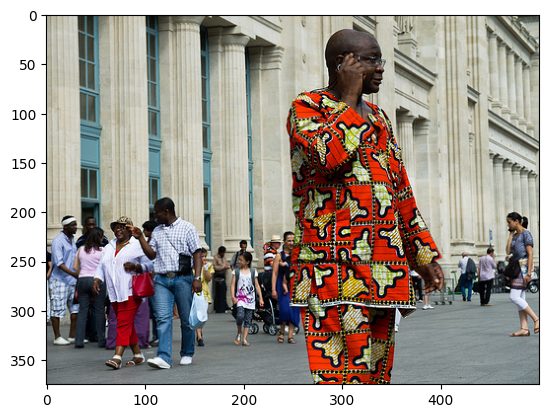

In [ ]:
i=plt.imread("/content/flickr30k_images/4980100317.jpg")
plt.imshow(i)

#Transfer Learning
#Images-->Features
#Text-->Features
# Step-1:Image Feature Extraction¶

In [ ]:
from keras.applications import ResNet50
model=ResNet50(weights="imagenet",input_shape=(224,224,3))
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [ ]:
from keras import Model
new_model=Model(model.input,model.layers[-2].output)

In [ ]:
#Extract Image Feature Vectors
def preprocess_img(img):
    img=image.load_img(img,target_size=(224,224))
    img=image.img_to_array(img)
    img=np.expand_dims(img,axis=0)#for reshaping
    #Normalization
    img=preprocess_input(img)
    return img

In [ ]:
img=preprocess_img("/content/flickr30k_images/1313987366.jpg")

[[[[ -27.939003  -43.779     -41.68    ]
   [ -25.939003  -41.779     -39.68    ]
   [ -25.939003  -41.779     -39.68    ]
   ...
   [-103.939    -115.779    -102.68    ]
   [-102.939    -116.779    -103.68    ]
   [-103.939    -116.779    -105.68    ]]

  [[ -25.939003  -41.779     -39.68    ]
   [ -24.939003  -40.779     -38.68    ]
   [ -23.939003  -39.779     -37.68    ]
   ...
   [-103.939    -115.779    -102.68    ]
   [-102.939    -116.779    -103.68    ]
   [-103.939    -116.779    -105.68    ]]

  [[ -22.939003  -38.779     -36.68    ]
   [ -22.939003  -38.779     -36.68    ]
   [ -21.939003  -37.779     -35.68    ]
   ...
   [-103.939    -115.779    -101.68    ]
   [-101.939    -116.779    -101.68    ]
   [-102.939    -115.779    -104.68    ]]

  ...

  [[-102.939    -116.779    -114.68    ]
   [-103.939    -116.779    -117.68    ]
   [-103.939    -116.779    -117.68    ]
   ...
   [ -98.939    -110.779    -113.68    ]
   [ -99.939    -111.779    -114.68    ]
   [ -99.939    

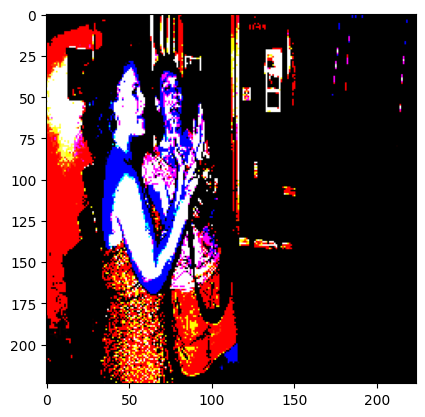

In [ ]:
print(img)
plt.imshow(img[0])

In [ ]:
 def encode_image(img):
        img=preprocess_img(img)
        feature_vector=new_model.predict(img)
        feature_vector=feature_vector.reshape((-1,))
        return feature_vector

In [ ]:
encoding_train={}

In [ ]:

#image_id-->feature_vector extracted from Resnet Image
from time import time
start=time()
IMG_PATH="/content/flickr30k_images"
for ix,img_id in enumerate(train):
    img_path=IMG_PATH+"/"+img_id+'.jpg'
    encoding_train[img_id]=encode_image(img_path)
    if ix%100==0:
        print("Encoding in Process Time step"+str(ix))
print("Total Time Taken:",time()-start)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 32ms/step
Encoding in Process Time step20500
1/1 [==============================] - 0s 34ms/step
Encoding in Process Time step20600
1/1 [==============================] - 0s 26ms/step
Encoding in Process Time step20700
1/1 [==============================] - 0s 35ms/step
Encoding in Process Time step20800
1/1 [==============================] - 0s 24ms/step
Encoding in Process Time step20900
1/1 [==============================] - 0s 24ms/step
Encoding in Process Time step21000
1/1 [==============================] - 0s 25ms/step
Encoding in Process Time step21100
1/1 [==============================] - 0s 47ms/step
Encoding in Process Time step21200
1/1 [==============================] - 0s 25ms/step
Encoding in Process Time step21300
1/1 [==============================] - 0s 31ms/step
Encoding in Process Time step21400
1/1 [==============================] - 0s 24ms/step
Encoding in Process Time st

In [ ]:
#Store everything to the desk
import pickle
with open("encoded_train_features.pkl","wb") as f:
    pickle.dump(encoding_train,f)

In [ ]:
encoding_test={}
from time import time
start=time()
IMG_PATH="/content/flickr30k_images"
for ix,img_id in enumerate(test):
    img_path=IMG_PATH+"/"+img_id+'.jpg'
    encoding_test[img_id]=encode_image(img_path)
    if ix%100==0:
        print("Encoding in Process Time step",ix)
print("Total Time Taken:",time()-start)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 23ms/step
Encoding in Process Time step 1500
1/1 [==============================] - 0s 22ms/step
Encoding in Process Time step 1600
1/1 [==============================] - 0s 32ms/step
Encoding in Process Time step 1700
1/1 [==============================] - 0s 23ms/step
Encoding in Process Time step 1800
1/1 [==============================] - 0s 29ms/step
Encoding in Process Time step 1900
1/1 [==============================] - 0s 23ms/step
Encoding in Process Time step 2000
1/1 [==============================] - 0s 37ms/step
Encoding in Process Time step 2100
1/1 [==============================] - 0s 25ms/step
Encoding in Process Time step 2200
1/1 [==============================] - 0s 23ms/step
Encoding in Process Time step 2300
1/1 [==============================] - 0s 25ms/step
Encoding in Process Time step 2400
1/1 [==============================] - 0s 35ms/step
Encoding in Process Time st

In [ ]:
with open("encoded_test_features.pkl","wb") as f:
    pickle.dump(encoding_test,f)

In [ ]:
from google.colab import files

In [ ]:
files.download('encoded_train_features.pkl')

## Data Preprocessing-Image Captions

In [ ]:
vocab_size=len(total_words)

In [ ]:
vocab_size

5118

In [ ]:
word_to_idx={}
idx_to_word={}

In [ ]:
for i,word in enumerate(total_words):
    word_to_idx[word]=i+1
    idx_to_word[i+1]=word

In [ ]:
word_to_idx#Word to index dictionary

{'in': 1,
 'the': 2,
 'on': 3,
 'and': 4,
 'man': 5,
 'is': 6,
 'of': 7,
 'with': 8,
 'woman': 9,
 'two': 10,
 'are': 11,
 'to': 12,
 'people': 13,
 'at': 14,
 'an': 15,
 'wearing': 16,
 'shirt': 17,
 'white': 18,
 'young': 19,
 'black': 20,
 'while': 21,
 'his': 22,
 'blue': 23,
 'red': 24,
 'girl': 25,
 'sitting': 26,
 'men': 27,
 'boy': 28,
 'standing': 29,
 'dog': 30,
 'playing': 31,
 'street': 32,
 'group': 33,
 'down': 34,
 'front': 35,
 'her': 36,
 'walking': 37,
 'holding': 38,
 'one': 39,
 'water': 40,
 'three': 41,
 'by': 42,
 'women': 43,
 'green': 44,
 'up': 45,
 'looking': 46,
 'child': 47,
 'as': 48,
 'for': 49,
 'little': 50,
 'large': 51,
 'outside': 52,
 'brown': 53,
 'yellow': 54,
 'person': 55,
 'children': 56,
 'through': 57,
 'hat': 58,
 'from': 59,
 'their': 60,
 'other': 61,
 'ball': 62,
 'small': 63,
 'next': 64,
 'into': 65,
 'over': 66,
 'some': 67,
 'dressed': 68,
 'out': 69,
 'another': 70,
 'running': 71,
 'building': 72,
 'jacket': 73,
 'riding': 74,
 'aro

In [ ]:
idx_to_word

{1: 'in',
 2: 'the',
 3: 'on',
 4: 'and',
 5: 'man',
 6: 'is',
 7: 'of',
 8: 'with',
 9: 'woman',
 10: 'two',
 11: 'are',
 12: 'to',
 13: 'people',
 14: 'at',
 15: 'an',
 16: 'wearing',
 17: 'shirt',
 18: 'white',
 19: 'young',
 20: 'black',
 21: 'while',
 22: 'his',
 23: 'blue',
 24: 'red',
 25: 'girl',
 26: 'sitting',
 27: 'men',
 28: 'boy',
 29: 'standing',
 30: 'dog',
 31: 'playing',
 32: 'street',
 33: 'group',
 34: 'down',
 35: 'front',
 36: 'her',
 37: 'walking',
 38: 'holding',
 39: 'one',
 40: 'water',
 41: 'three',
 42: 'by',
 43: 'women',
 44: 'green',
 45: 'up',
 46: 'looking',
 47: 'child',
 48: 'as',
 49: 'for',
 50: 'little',
 51: 'large',
 52: 'outside',
 53: 'brown',
 54: 'yellow',
 55: 'person',
 56: 'children',
 57: 'through',
 58: 'hat',
 59: 'from',
 60: 'their',
 61: 'other',
 62: 'ball',
 63: 'small',
 64: 'next',
 65: 'into',
 66: 'over',
 67: 'some',
 68: 'dressed',
 69: 'out',
 70: 'another',
 71: 'running',
 72: 'building',
 73: 'jacket',
 74: 'riding',
 75: 

In [ ]:
len(word_to_idx)

5118

In [ ]:
idx_to_word[5119]="startseq"
idx_to_word[5120]="endseq"
word_to_idx["startseq"]=5119
word_to_idx['endseq']=5120

In [ ]:
vocab_size=len(word_to_idx)+1
print("Vocab size:",vocab_size)

Vocab size: 5121


In [ ]:
maxlen=0
for key in train_descriptions.keys():
    for cap in train_descriptions[key]:
        maxlen=max(maxlen,len(cap.split(" ")))

In [ ]:
print("maximum length of the sentence in the training data:",maxlen)

maximum length of the sentence in the training data: 74


## Data Loader(Generator)

In [ ]:
def data_generator(train_descriptions,encoding_train,word_to_idx,maxlen,batch_size):
    x1,x2,y=[],[],[]
    n=0
    while True:
        for key,desc_list in train_descriptions.items():
            n+=1
            photo=encoding_train[key]
            for desc in desc_list:
                seq=[word_to_idx[word] for word in desc.split() if word in word_to_idx]
                for  i in range(1,len(seq)):
                    xi=seq[0:i]
                    yi=seq[i]
                    #0 denote padding word
                    xi=pad_sequences([xi],maxlen=maxlen,value=0,padding='post')[0]
                    yi=to_categorical([yi],num_classes=vocab_size)[0]
                    x1.append(photo)
                    x2.append(xi)
                    y.append(yi)
                if n==batch_size:
                    yield [[np.array(x1),np.array(x2)],np.array(y)]
                    x1,x2,y=[],[],[]
                    n=0

## Word Embeddings

In [ ]:
f=open("/content/glove.6B.300d.txt",encoding='utf8')

In [ ]:
embedding_index={}
for line in f:
    values=line.split()
    word=values[0]
    word_embedding=np.array(values[1:],dtype='float')
    embedding_index[word]=word_embedding
f.close()

In [ ]:
def get_embedding_matrix():
    emb_dim=300
    matrix=np.zeros((vocab_size,emb_dim ))
    for word,idx in word_to_idx.items():
        embedding_vector=embedding_index.get(word)
        if embedding_vector is not None:
            matrix[idx]=embedding_vector
    return matrix

In [ ]:
embedding_matrix=get_embedding_matrix()
embedding_matrix.shape

(5121, 300)

## Model Architecture

In [ ]:
input_img_features=Input(shape=(2048,))
inp_img1=Dropout(0.3)(input_img_features)
inp_img2=Dense(256,activation='relu')(inp_img1)

In [ ]:
#caption as input
input_captions=Input(shape=(maxlen,))
inp_cap1=Embedding(input_dim=vocab_size,output_dim=300,mask_zero=True)(input_captions)
inp_cap2=Dropout(0.3)(inp_cap1)
inp_cap3=LSTM(256)(inp_cap2)

In [ ]:
decoder1=add([inp_img2,inp_cap3])
decoder2=Dense(256,activation='relu')(decoder1)
outputs=Dense(vocab_size,activation='softmax')(decoder2)

In [ ]:
#Combined model
model=Model(inputs=[input_img_features,input_captions],outputs=outputs)

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 74)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 74, 300)      1536300     ['input_3[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_2[0][0]']                
                                                                                            

In [ ]:
model.layers[2].set_weights([embedding_matrix])

In [ ]:
model.layers[2].trainable=False

In [ ]:
model.compile(loss='categorical_crossentropy',optimizer="adam")

In [ ]:
!mkdir model_weights_30k

In [ ]:
epochs=20
batch_size=3
steps=len(train_descriptions)//batch_size
def train():
    for i in range(epochs):
        generator=data_generator(train_descriptions,encoding_train,word_to_idx,maxlen,batch_size)
        model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1)
        model.save('./model_weights_30k/model_'+str(i)+'.h5')

In [ ]:
train()

<ipython-input-101-dc5d7ed2e471>:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1)


8475/8475 [==============================] - 164s 19ms/step - loss: 3.3168


In [ ]:
model=load_model('/content/model_weights_30k/model_19.h5')

## Predictions

In [ ]:
def predict_caption(photo):
    in_text='startseq'
    for i in range(maxlen):
        sequence=[word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence=pad_sequences([sequence],maxlen=maxlen,padding='post')
        ypred=model.predict([photo,sequence])
        ypred=ypred.argmax()#gives word with maximum probability--greedy sampling
        word=idx_to_word[ypred]
        in_text+=' '+word
        if word=='endseq':
            break
    final_caption=in_text.split()[1:-1]
    final_caption=' '.join(final_caption)
    return final_caption

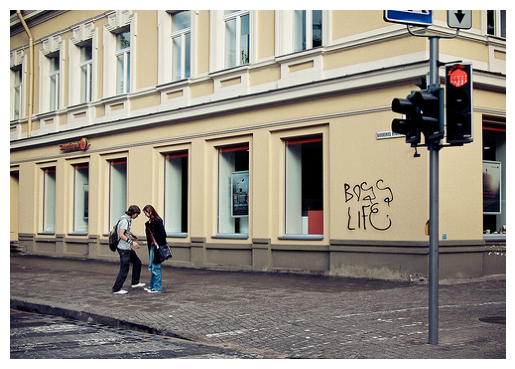

1/1 [==============================] - 0s 22ms/step
man in blue shirt is standing in front of building


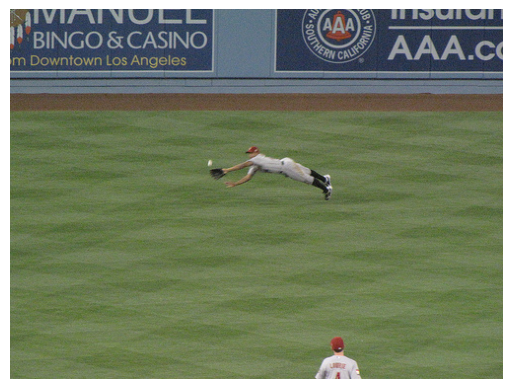

1/1 [==============================] - 0s 21ms/step
baseball player in red uniform is running in the air


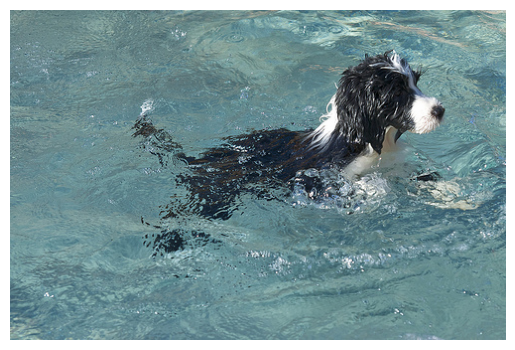

1/1 [==============================] - 0s 23ms/step
black dog is running through water


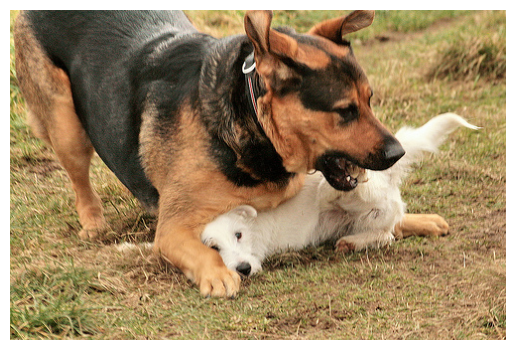

1/1 [==============================] - 0s 67ms/step
two dogs are running in the grass


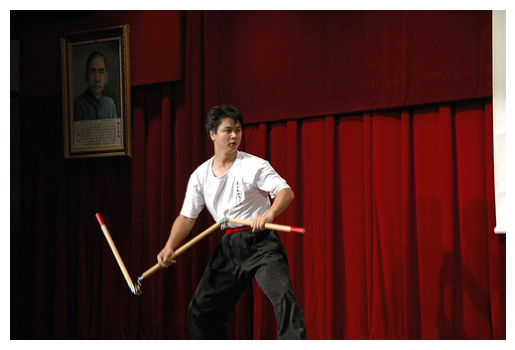

1/1 [==============================] - 0s 24ms/step
man in black shirt and jeans is sitting on the floor with his hands folded


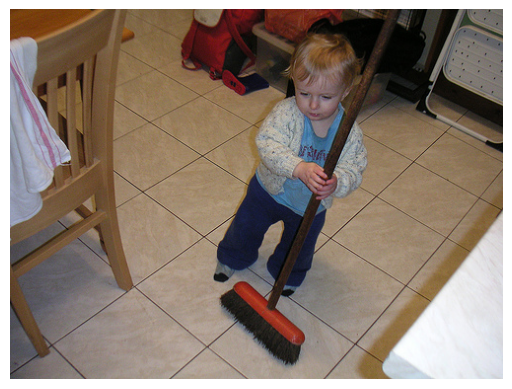

1/1 [==============================] - 0s 39ms/step
man in blue shirt is sitting on the floor with his hands folded


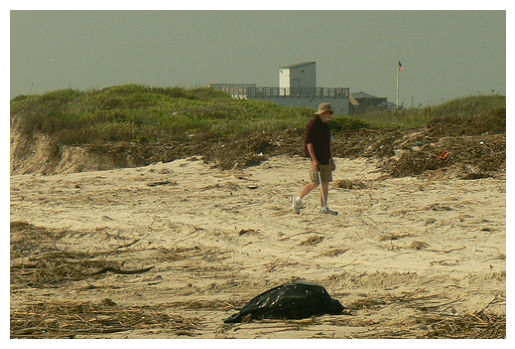

1/1 [==============================] - 0s 38ms/step
man in blue shirt is walking down the road


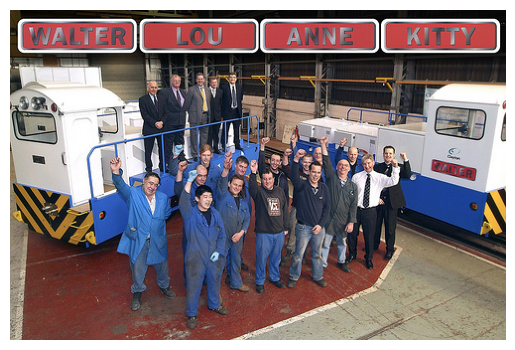

1/1 [==============================] - 0s 33ms/step
group of people are walking down the street


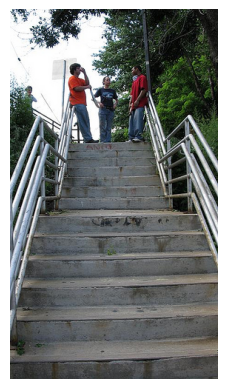

1/1 [==============================] - 0s 31ms/step
man in blue shirt is standing on the side of the road


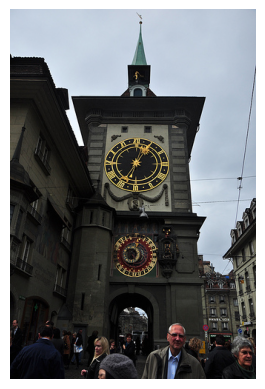

1/1 [==============================] - 0s 29ms/step
man in blue shirt is standing in front of store


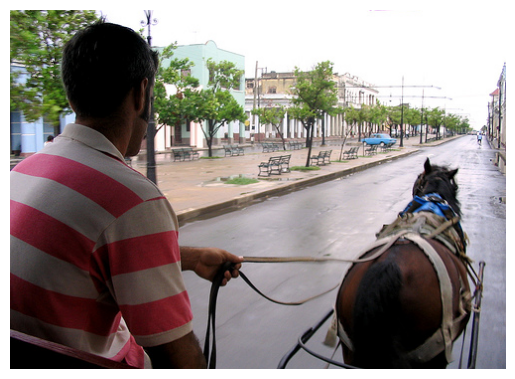

1/1 [==============================] - 0s 31ms/step
man in blue shirt and jeans is sitting on the ground with his hands in his hand


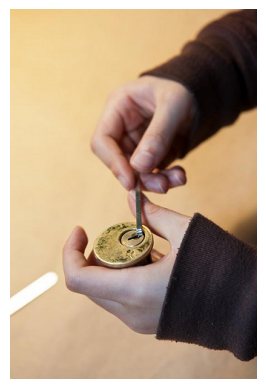

1/1 [==============================] - 0s 33ms/step
man in blue shirt is working on project


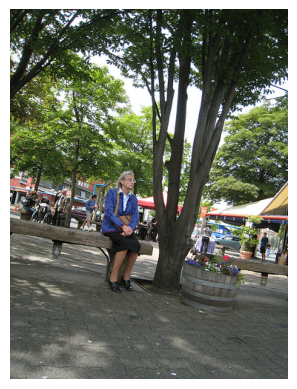

1/1 [==============================] - 0s 29ms/step
man in blue shirt and jeans is walking down the street


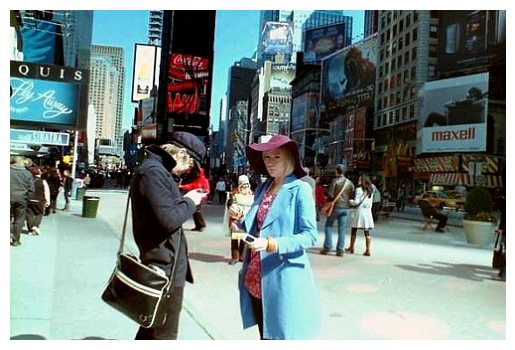

1/1 [==============================] - 0s 29ms/step
man in black shirt and woman in black shirt are walking down the street


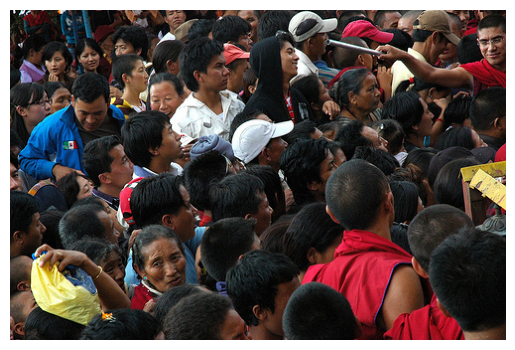

1/1 [==============================] - 0s 30ms/step
group of people are sitting in circle


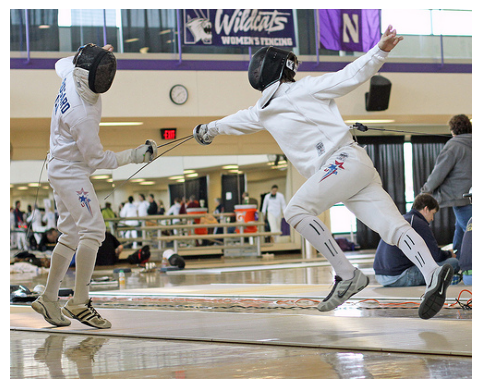

1/1 [==============================] - 0s 37ms/step
tennis player in white uniform is jumping into the air to hit the ball


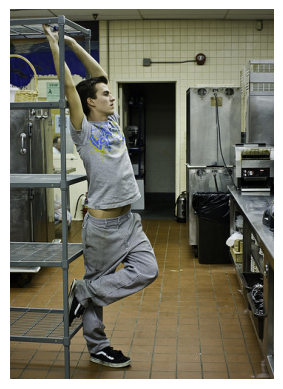

1/1 [==============================] - 0s 29ms/step
man in blue shirt is sitting on the floor


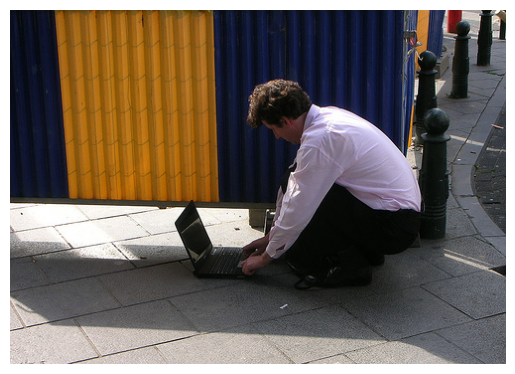

1/1 [==============================] - 0s 33ms/step
man in blue shirt is standing in front of store


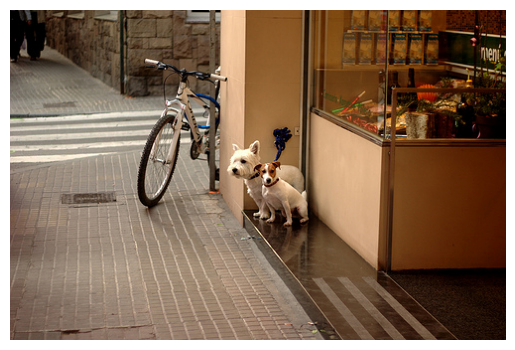

1/1 [==============================] - 0s 29ms/step
man in blue shirt is standing in front of store


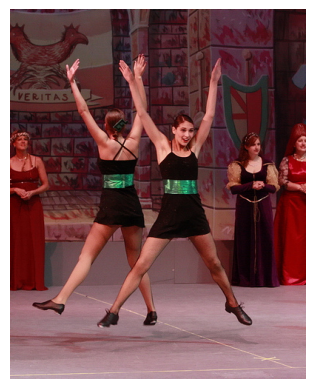

1/1 [==============================] - 0s 31ms/step
group of people are playing volleyball


In [ ]:
for i in range(20):
    rn =  np.random.randint(0, 1000)
    img_name = list(encoding_test.keys())[rn]
    photo = encoding_test[img_name].reshape((1,2048))

    i = plt.imread('/content/flickr30k_images/'+img_name+".jpg")
    plt.imshow(i)
    plt.axis("off")
    plt.show()

    caption = predict_caption(photo)
    print(caption)